# Santiago Murgueitio, Juan Sebastian Ortiz

### Convoluciones a mano

A lo largo de esta sección vamos a estar trabajando con las librerias de OpenCV y Pillow para tratamiento de imagenes.

- Pillow -> Esta diseñada para manipulación/procesamiento de imagenes
- OpenCV -> Esta diseñada para visión computacional

Si bien en general casi todo lo que hacemos con Pillow lo podemos hacer con OpenCV, decidimos usarlo para también familiarizarnos con ambas librerias, además hay algunas cosas que es más sencillo hacer en Pillow :)  


Primero vamos a realizar un ejemplo con una imagen a blanco y negro para entender mejor el procedimiento

In [ ]:
import os

import cv2 # OpenCV
import PIL as pil# Pillow
import numpy as np
import matplotlib.pyplot as plt
import pathlib

from google.colab.patches import cv2_imshow

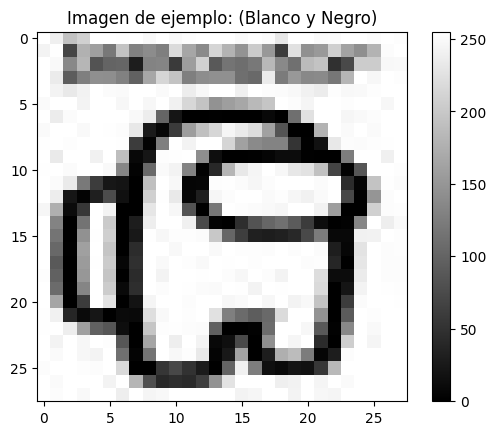

In [ ]:
img = cv2.imread('amongus1.jpg', cv2.IMREAD_GRAYSCALE)

# Verificar que la imagen se haya cargado correctamente
if img is None:
    print("Error: No se pudo cargar la imagen.")
else:
    # Mostrar la imagen original
    plt.imshow(img, cmap='gray', interpolation='nearest')
    plt.title("Imagen de ejemplo: (Blanco y Negro)")
    plt.colorbar()
    plt.show()

En la imagen que estamos trabajando los valores de cada píxel estarán entre 0 y 255, donde:

- 0 -> representa el color negro.
- 255 -> representa el color blanco.

In [ ]:
# Vamos a cargar la imagen con pillow y vamos a verla con los valores de los pixeles
img = pil.Image.open("amongus1.jpg")

img_array = np.array(img)
for row in img_array:
    print(" ".join(f"{pixel:3}" for pixel in row))

255 239 193 208 255 255 254 255 249 255 249 253 255 255 255 250 254 251 231 255 255 250 251 255 255 252 255 253
243 254  69 177 159 120 196 129 140 127 219 166 138 213 179 147 203 152  61 225 144 153 207 162 143 180 252 255
255 249 136 182  83 100 102  29 132 133  58 157 209  89 116 110 120 184 137 112 187 196  49  73 204 204 248 249
255 235  93 127 143 142 129  97 167 214 195 127 141 144 144 111 106 235 123 152 136 138 119 181 255 247 255 253
255 244 233 242 255 251 250 255 255 250 255 237 248 255 255 240 255 252 251 248 241 236 253 248 249 253 255 255
250 255 255 244 255 255 247 255 247 255 241 215 196 146 158 167 185 197 255 252 245 255 255 253 255 255 247 255
255 236 251 255 255 255 255 249 237 101  21   0   0   1   0   0   0   8   0 111 225 255 255 246 249 252 255 255
250 255 255 249 255 254 252 232  26   6  59 157 192 214 245 234 221 161  84   0   0 180 255 250 255 250 255 255
254 255 253 255 255 255 254  61   3 127 255 244 255 255 213 161 138 131 131  53   1  17 232 252 251 253 

Ahora que entendemos un poco mejor como se ve la representación de una imagen a blanco y negro, vamos a realizar una convolución.

- Sin embargo, para la convolución que vamos a hacer a mano (lapiz y papel), vamos a tomar una fracción de 10x10 de la imagen
- Luego con Python haremos la convolución a la imagen entera usando tanto ciclos For como OpenCV

In [ ]:
print(img_array[:10, :10])

[[255 239 193 208 255 255 254 255 249 255]
 [243 254  69 177 159 120 196 129 140 127]
 [255 249 136 182  83 100 102  29 132 133]
 [255 235  93 127 143 142 129  97 167 214]
 [255 244 233 242 255 251 250 255 255 250]
 [250 255 255 244 255 255 247 255 247 255]
 [255 236 251 255 255 255 255 249 237 101]
 [250 255 255 249 255 254 252 232  26   6]
 [254 255 253 255 255 255 254  61   3 127]
 [255 234 255 255 241 255 190   8  22 253]]


Si quieremos movernos para tomar otro fragmento de la imagen podemos ejecutar el sig código, esto nos permite movernos a un punto más central de la imagen para tomar el fragmento de 10x10. Esto lo hago para no hacer el proceso simplemente con el fondo de la imagen (puesto que ahi casi todo tendrá los valores de 255 por el fondo blanco)

In [ ]:
center_x = 9  # Índice de la columna que empieza en el centro horizontal
center_y = 9  # Índice de la fila que empieza en el centro vertical

print(img_array[center_y:center_y+10, center_x:center_x+10])

### En este caso, esto es valido únicamente para imagenes que tengan una dimensión de 28x28
### De tener una dimensión diferente debes ajustar los valores. sin embargo, no me iba a poner a generalizar esto ahora.

[[253 254 255 142  14   0   0   1   5  12]
 [250 244 131   2  41 181 232 245 255 247]
 [255 248   5   6 253 254 251 246 252 255]
 [254 233   7  31 246 252 255 255 250 253]
 [255 247  83   0 119 255 253 251 249 246]
 [255 255 240  73   3   0  46  83 102 112]
 [247 253 253 251 200 102  62  33  29  32]
 [255 248 255 255 249 255 253 253 252 255]
 [249 255 253 249 255 254 255 253 255 255]
 [244 255 255 254 255 252 247 255 252 243]]


Supongamos que vamos a trabajar con el Kernel o filtro de Laplace 3x3.
Habitualmente utilizado para realce o detección de bordes.

In [ ]:
kernel = np.array([[-1, -1, -1],
                   [-1,  8, -1],
                   [-1, -1, -1]])

Vamos a realizar la convolución asumiendo que tenemos un padding = 0 (es decir, no tenemos padding) y un stride = 1 (es decir, nos movemos de 1 en 1)

In [ ]:
# Imagen de entrada 10x10
# Recordemos que esto es solo una fracción de la imagen principal

img = np.array([[253, 254, 255, 142,  14,   0,   0,   1,   5,  12],
                [250, 244, 131,   2,  41, 181, 232, 245, 255, 247],
                [255, 248,   5,   6, 253, 254, 251, 246, 252, 255],
                [254, 233,   7,  31, 246, 252, 255, 255, 250, 253],
                [255, 247,  83,   0, 119, 255, 253, 251, 249, 246],
                [255, 255, 240,  73,   3,   0,  46,  83, 102, 112],
                [247, 253, 253, 251, 200, 102,  62,  33,  29,  32],
                [255, 248, 255, 255, 249, 255, 253, 253, 252, 255],
                [249, 255, 253, 249, 255, 254, 255, 253, 255, 255],
                [244, 255, 255, 254, 255, 252, 247, 255, 252, 243]])

Aqui vamos a crear una matriz (llena de ceros) que va a contener las dimensiones que deberiamos tener a la salida, en nuestro caso será de 8x8 puesto que al tener stride=1 y padding=0 perderiamos 2 bordes a cada lado de la imagen, por ende, 10 - 2 y 10 - 2 = 8x8

In [ ]:
output = np.zeros((img.shape[0] - 2, img.shape[1] - 2))  # Dimensión (8x8) porque stride=1 y padding=0
print(output)

[[0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
# Aplicar la convolución con un bucle
for i in range(img.shape[0] - 2):  # Recorrer filas (8 iteraciones)
    for j in range(img.shape[1] - 2):  # Recorrer columnas (8 iteraciones)
        # Tomar un bloque 3x3 de la imagen
        fragment = img[i:i+3, j:j+3]

        # Realizar la convolución multiplicando el fragmento por el kernel y sumando
        result = np.sum(fragment * kernel)

        # Asignar el resultado en la imagen de salida
        output[i, j] = result


# Mostrar la imagen resultante
print("Imagen resultante de la convolución:")
print(output)

Imagen resultante de la convolución:
[[  301.  -108.  -831.  -524.   403.   678.   718.   777.]
 [  605.  -862.  -668.  1011.   321.    88.   -27.    10.]
 [  510.  -797.  -471.   798.   130.    23.    33.    -7.]
 [  394.  -422.  -802.    92.   866.   627.   515.   440.]
 [  207.   505.  -565.  -976. -1040.  -671.  -361.  -219.]
 [   16.   194.   480.   412.  -252.  -529.  -816.  -890.]
 [  -36.    23.    75.   171.   410.   557.   632.   651.]
 [   26.    -2.   -39.    17.    11.    18.     2.    22.]]


Si quisieramos ver el resultado de haber realizado esta convolución ya no con los valores sino como imagen podemos hacer los siguiente

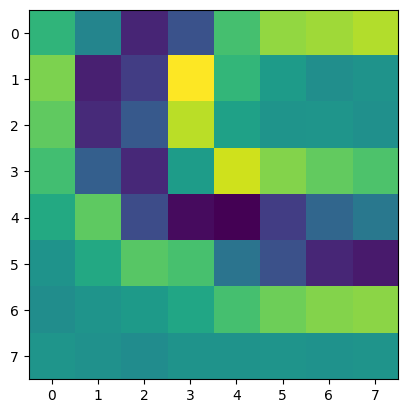

In [ ]:
plt.imshow(output)

Aqui seria natural hacernos las siguientes preguntas

- **¿Por qué estoy viendo colores?**
- **Si la imagen era a blanco a negro ¿que sentido tiene ver colores aquí?**

La respuesta a esto es sencilla, pero es sumamente importante tenerlo en cuenta, en el momento en que nosotros realizamos una convolución a una imagen, el resultado de este proceso ya no corresponde a una escala en particular. es decir...

- Si yo estoy trabajando con una imagen blanco y negro (donde los valores de los pixeles van de 0 a 255) al aplicar una convolución los valores resultantes ya no van a estar dentro de este rango...

- De la misma forma si estoy trabajando con una imagen a color (que contiene 3 canales Red, Green, Blue), el resultado de nuevo no va a corresponder al rango de valores, en este caso, incluso no va a dejar de tener 3 canales, y por lo que va a hacer es promediar los resultados al convolucionar el kernel con cada uno de los mismos (Esto lo vamos a ver con detalle más adelante)

#### Imagen a color (RGB)

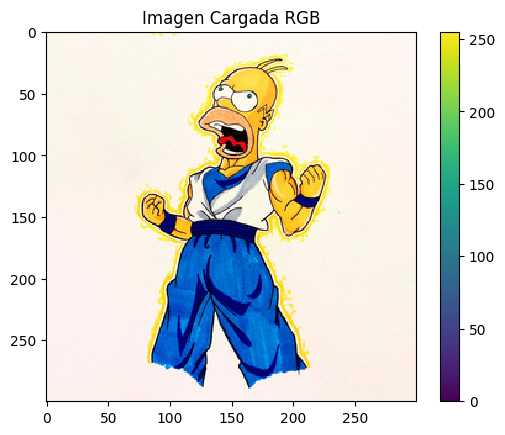

In [ ]:
# Leer la imagen en color (BGR por defecto)
img = cv2.imread('homero.jpeg', cv2.IMREAD_COLOR)

# Verificar que la imagen se haya cargado correctamente
if img is None:
    print("Error: No se pudo cargar la imagen.")
else:
    # Convertir la imagen de BGR a RGB para usarla en Matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen original
    plt.imshow(img_rgb, interpolation='nearest')
    plt.title("Imagen Cargada RGB")
    plt.colorbar()
    plt.show()

En la celda anterior debemos identificar dos cosas que cambiaron con respecto al proceso que realizamos con la imagen a blanco y negro:

- Ahora usamos `cv2.IMREAD_COLOR` en lugar de `cv2.IMREAD_GRAYSCALE`. estos cambian la manera en que leemos la imagen.

- Al momento de plotear la imagen se utilizo: `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)`, el motivo de esto es importante..

Resulta que openCV fue desarrollada en 1999 por Intel (Aunque se volvio open source en el 2000), para aquel entonces, el esquema habitual que habia para el procesamiento de imagenes a color era **"BGR" (Básicamente los mismos colores pero en un orden distinto al RGB que conocemos hoy)** Esto decidieron dejarlo así por una cuestión de historia, pero debemos tener en cuenta al momento de trabajar la imagenes o sino podríamos resultar mostrando una imagen que no corresponde a la original (pues tiene los canales en un orden distinto)

Aqui un pequeño ejemplo:

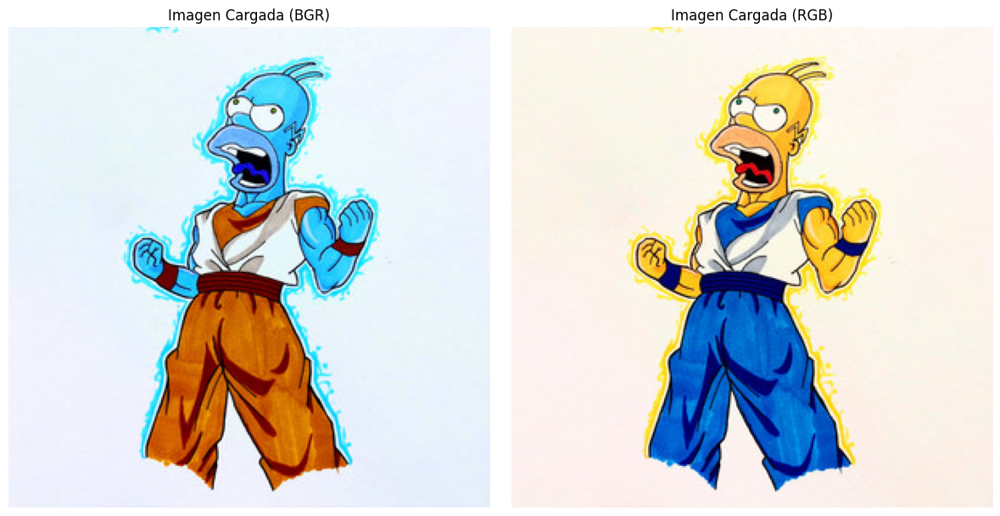

In [ ]:
# Leer la imagen en color (BGR por defecto)
img = cv2.imread('homero.jpeg', cv2.IMREAD_COLOR)

# Crear un gráfico con dos subgráficos (1 fila, 2 columnas)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Mostrar la imagen BGR en el primer subgráfico (izquierda)
ax[0].imshow(img)
ax[0].set_title("Imagen Cargada (BGR)")
ax[0].axis('off')

# Mostrar la imagen RGB en el segundo subgráfico (derecha)
ax[1].imshow(img_rgb)
ax[1].set_title("Imagen Cargada (RGB)")
ax[1].axis('off')

# Mostrar el gráfico
plt.tight_layout()
plt.show()


*En una parece SSJ fase 1 y en la otra fase Blue Jjajajaja*

Ahora si al igual que a mi en un principio les resulta confuso ver cómo es la composición de estos canales imagen que el canal viene siendo una "tercera dimensión" para la imagen, así que podemos hacer lo siguiente:


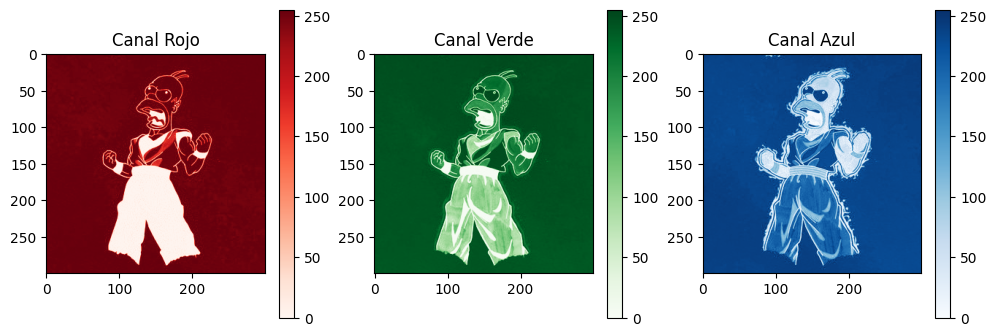

In [ ]:
# Separar los canales BGR
blue_channel = img[:, :, 0]  # Canal Azul
green_channel = img[:, :, 1]  # Canal Verde
red_channel = img[:, :, 2]  # Canal Rojo

# Mostrar los canales usando Matplotlib
plt.figure(figsize=(12, 4))

# Canal Rojo
plt.subplot(1, 3, 1)
plt.imshow(red_channel, cmap='Reds')
plt.title('Canal Rojo')
plt.colorbar()

# Canal Verde
plt.subplot(1, 3, 2)
plt.imshow(green_channel, cmap='Greens')
plt.title('Canal Verde')
plt.colorbar()

# Canal Azul
plt.subplot(1, 3, 3)
plt.imshow(blue_channel, cmap='Blues')
plt.title('Canal Azul')
plt.colorbar()

# Mostrar las imágenes
plt.show()


Los canales se podrían ver como se ven en la imagen anterior, cada canal va a mostrar su propia intensidad y luego al superponer cada uno sobre otro vamos a tener cómo resultado la imagen que conocemos de toda la vida :)

- *pd: a esto es a lo que me refiero con la diferencia entre el RGB y el BGR serían los mismos canales solo que el orden en que se superpone cada uno cambia.*

Ahora surge otra pregunta, ¿Cómo cambian los pixeles cuando las imagenes tienen varios canales? (Digo varios porqué los canales RGB o BGR no son los únicos que existen, hay img que tienen muchos más canales)

In [ ]:
# Mostrar cada canal como matriz de píxeles
print("Matriz del Canal Azul (B):")
print(blue_channel)

print("\nMatriz del Canal Verde (G):")
print(green_channel)

print("\nMatriz del Canal Rojo (R):")
print(red_channel)

Matriz del Canal Azul (B):
[[238 238 236 ... 239 241 243]
 [238 238 238 ... 239 241 243]
 [240 240 238 ... 241 241 241]
 ...
 [239 239 239 ... 231 231 231]
 [239 239 239 ... 232 232 232]
 [239 239 239 ... 233 233 233]]

Matriz del Canal Verde (G):
[[247 247 246 ... 247 247 246]
 [247 247 246 ... 247 247 246]
 [246 246 247 ... 247 247 247]
 ...
 [241 241 241 ... 237 237 237]
 [241 241 241 ... 238 238 238]
 [241 241 241 ... 239 239 239]]

Matriz del Canal Rojo (R):
[[251 251 253 ... 254 254 254]
 [251 251 253 ... 254 254 254]
 [251 251 251 ... 254 254 254]
 ...
 [252 252 252 ... 248 248 248]
 [252 252 252 ... 249 249 249]
 [251 251 251 ... 250 250 250]]


Por eso es que si yo hago un print de la imagen (que contiene los 3 canales) cada pixel va a estar dado con un array de 3 elementos. es decir, el primer pixel de la imagen va a estar compuesto por los primeros valores de cada uno de los canales. Veamoslo.

In [ ]:
print(img)

[[[238 247 251]
  [238 247 251]
  [236 246 253]
  ...
  [239 247 254]
  [241 247 254]
  [243 246 254]]

 [[238 247 251]
  [238 247 251]
  [238 246 253]
  ...
  [239 247 254]
  [241 247 254]
  [243 246 254]]

 [[240 246 251]
  [240 246 251]
  [238 247 251]
  ...
  [241 247 254]
  [241 247 254]
  [241 247 254]]

 ...

 [[239 241 252]
  [239 241 252]
  [239 241 252]
  ...
  [231 237 248]
  [231 237 248]
  [231 237 248]]

 [[239 241 252]
  [239 241 252]
  [239 241 252]
  ...
  [232 238 249]
  [232 238 249]
  [232 238 249]]

 [[239 241 251]
  [239 241 251]
  [239 241 251]
  ...
  [233 239 250]
  [233 239 250]
  [233 239 250]]]


Ahora sí empecemos las convoluciones... mucho texto

In [ ]:
# Vamos a trabajar con el mismo filtro del primer ejemplo (Laplace 3x3)
kernel = np.array([[ -1, -1,  -1],
                   [-1,  8, -1],
                   [ -1, -1,  -1]])


Ahora en lugar de hacerlo a pie, vamos a utilizar Opencv (es increible lo fácil que lo hace) :0

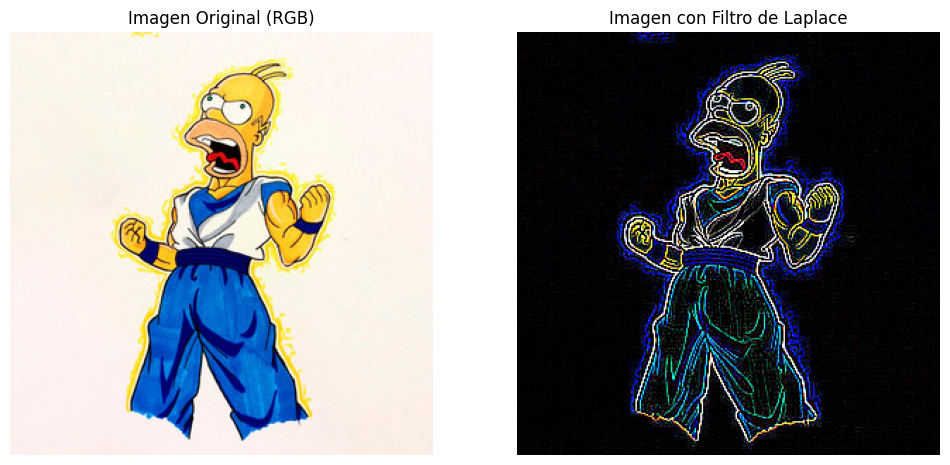

In [ ]:
# Aplicar el filtro a la imagen usando la función filter2D de OpenCV
img_filtered = cv2.filter2D(img_rgb, -1, kernel)

# Mostrar la imagen original y la imagen filtrada
plt.figure(figsize=(12, 6))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Imagen Original (RGB)")
plt.axis('off')

# Imagen con filtro de Laplace
plt.subplot(1, 2, 2)
plt.imshow(img_filtered)
plt.title("Imagen con Filtro de Laplace")
plt.axis('off')

plt.show()


Ahora aqui es importante tener algo en cuenta, cuando nosotros estamos trabajando con imagenes RGB y estamos haciendo una convolución el proceso es el siguiente:

- Primero, realizas el proceso de convolución a cada canal por separado.
- Los resultados obtenidos los debemos promediar, es decir, sumarlos y dividirlos entre 3 (en el caso de las imagenes RGB)
- El valor resultante de este proceso será el resultado que debe ir en la matriz resultante.

Sin embargo, cuando hacemos el proceso de convolución con OpenCV usando

Si nosotros quisieramos ver los resultados de esta convolución podríamos verlo de la siguiente manera (Aquí estoy organizando la salida para que lo muestre de manera horizontal)

In [ ]:
filtered_segment = img_filtered[:10, :10, :]
# Formatear y mostrar los primeros 10x10 píxeles de manera alineada
print("Imagen filtrada (primer bloque 10x10):\n")
for i in range(filtered_segment.shape[0]):  # Iterar sobre las filas
    for j in range(filtered_segment.shape[1]):  # Iterar sobre las columnas (10 píxeles)
        # Imprimir los valores de cada píxel (Rojo, Verde, Azul) de forma ordenada
        print(f"[{filtered_segment[i, j, 2]:3}, {filtered_segment[i, j, 1]:3}, {filtered_segment[i, j, 0]:3}]", end=" ")
    print()  # Nueva línea después de cada fila

Imagen filtrada (primer bloque 10x10):

[  0,   0,   0] [  2,   3,   0] [  0,   0,   6] [  0,   1,   1] [  0,   0,   0] [  0,   0,   3] [  0,   4,   2] [  0,  10,   0] [ 13,   0,   5] [  6,   0,   7] 
[  0,   3,   0] [  0,   4,   0] [  2,   0,   8] [  9,   0,   3] [  0,   4,   3] [  0,   0,   0] [  0,   0,   4] [  0,   0,   1] [ 15,   0,   9] [ 10,   0,   1] 
[  6,   0,   0] [  8,   0,   0] [  0,   7,   0] [  0,   0,   6] [  2,   2,   4] [  0,   0,   0] [  4,   0,   0] [  1,   2,   0] [  0,   2,   0] [  0,   0,   3] 
[  6,   0,   0] [  8,   0,   0] [  8,   0,   0] [  8,   0,   0] [  9,   1,   9] [  0,   2,   8] [  0,   4,  10] [  0,   0,   5] [  0,   4,   0] [  0,   3,   0] 
[  0,   4,   0] [  0,   4,   0] [  0,   4,   0] [  8,   0,   0] [  8,   0,   0] [  8,   0,   0] [  9,   0,   0] [ 14,   0,   3] [  0,   0,   0] [  2,   0,   1] 
[  5,   0,  13] [  5,   1,   0] [  4,   1,   0] [  0,   2,   0] [  0,   3,   1] [  0,   3,   3] [  8,   3,   0] [ 15,   5,   0] [  0,   0,   0] [  7,   0, 

In [ ]:
# Obtener los tres canales filtrados
img_filtered_R = img_filtered[:, :, 0]
img_filtered_G = img_filtered[:, :, 1]
img_filtered_B = img_filtered[:, :, 2]

img_filtered_average = (img_filtered_R + img_filtered_G + img_filtered_B) / 3

print(img_filtered_average)
#img_filtered_average = np.uint8(img_filtered_average)

[[0.         1.66666667 2.         ... 0.         1.         4.        ]
 [1.         1.33333333 3.33333333 ... 0.         0.66666667 4.66666667]
 [2.         2.66666667 2.33333333 ... 1.33333333 0.33333333 0.33333333]
 ...
 [0.         0.         0.33333333 ... 0.         0.         0.        ]
 [1.         1.         0.66666667 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 6.         6.         6.        ]]


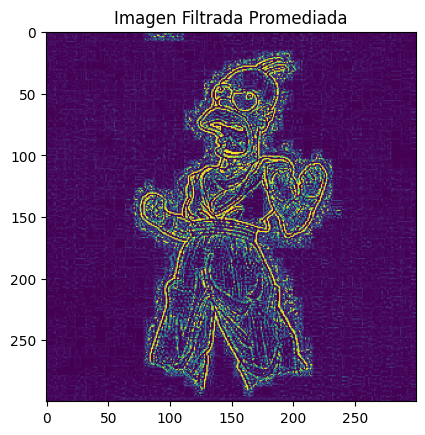

In [ ]:
# Mostrar la imagen resultante
plt.imshow(img_filtered_average)
plt.title("Imagen Filtrada Promediada")
plt.show()

Además de las convoluciones también es común ver

### Obtención de 100 imagenes de internet

Para la realización de este ejercicio decidimos extraer las imagenes del GBIF (Global Biodiversity Information Facility) usando su API. Aqui encontraremos distintas especies de animales y plantas. Para más información vea el [GBIF](https://www.gbif.org/)

A tener en cuenta:

- Es importante recalcar que estas imagenes no hacen parte cómo tal de un "dataset" del GBIF sino que más bien son extraidas de fuentes externas por el GBIF y ellos las ponen a disposición por medio de su API.
- El punto anterior implica que estás imagenes no estan estandarizadas, no tienen la misma resolución, ni tienen un patrón en su fondo, ni corresponden a una misma categoría (podemos encontrar flores, arboles, insectos, aves, etc...) esto nos llevo a considerar que era una buena idea trabajar con ellas.
- Todo el contenido extraido del GBIF está sujeto a una [licencia](https://ipt.gbif.org/manual/es/ipt/latest/applying-license) que prohibe su uso para fines comerciales.

In [ ]:
import requests
import os

In [ ]:
def obtener_imagenes_gbif(n=100):
    url = "https://api.gbif.org/v1/occurrence/search"
    parametros = {
        "limit": n,  # Limita los resultados a 'n' registros
        "hasCoordinate": "true",
        "mediaType": "StillImage"  # Solo registros con imágenes
    }

    respuesta = requests.get(url, params=parametros)
    if respuesta.status_code == 200:
        registros = respuesta.json().get("results", [])
        imagenes = []
        for registro in registros:
            if "media" in registro:
                for medio in registro["media"]:
                    if medio.get("type") == "StillImage":
                        imagenes.append(medio.get("identifier"))
        return imagenes
    else:
        print(f"Error en la consulta: {respuesta.status_code}")
        return []

# Obtener 100 imágenes
imagenes = obtener_imagenes_gbif(200)
print("This is the len of the extracted imgs", len(imagenes))

This is the len of the extracted imgs 454


En la celda anterior extrajimos la información del GBIF pero solamente obtenemos los URLs de las imagenes (recordemos que estás vienen de distintos lugares de internet) ahora vamos a crear una carpeta para guardar estás imagenes dentro de nuestro entorno de trabajo

In [ ]:
def create_dir(name_dir):
    if not os.path.exists(name_dir):  # Usar name_dir en lugar de folder_name
        os.makedirs(name_dir)
        print(f'Folder {name_dir} created successfully!')
    else:
        print(f'Folder {name_dir} already exists.')

In [ ]:
folder_name = 'imagenes_gbif'
create_dir(folder_name)

Folder imagenes_gbif created successfully!


In [ ]:
# Descargar las imágenes
for i, url in enumerate(imagenes[:200], start=1):  # Solo tomamos las primeras 100 imágenes
    try:
        # Obtener la imagen
        response = requests.get(url, stream=True)
        if response.status_code == 200:
            # Guardar la imagen en el directorio
            file_name = f"{folder_name}/imagen_{i}.jpg"
            with open(file_name, 'wb') as file:
                for chunk in response.iter_content(1024):
                    file.write(chunk)
            print(f"Imagen {i} guardada en {file_name}")
        else:
            print(f"Error al descargar la imagen {i}")
    except Exception as e:
        print(f"Error al procesar la imagen {i}: {e}")

print("Descarga completa.")

Imagen 1 guardada en imagenes_gbif/imagen_1.jpg
Imagen 2 guardada en imagenes_gbif/imagen_2.jpg
Imagen 3 guardada en imagenes_gbif/imagen_3.jpg
Imagen 4 guardada en imagenes_gbif/imagen_4.jpg
Imagen 5 guardada en imagenes_gbif/imagen_5.jpg
Imagen 6 guardada en imagenes_gbif/imagen_6.jpg
Imagen 7 guardada en imagenes_gbif/imagen_7.jpg
Imagen 8 guardada en imagenes_gbif/imagen_8.jpg
Imagen 9 guardada en imagenes_gbif/imagen_9.jpg
Imagen 10 guardada en imagenes_gbif/imagen_10.jpg
Imagen 11 guardada en imagenes_gbif/imagen_11.jpg
Imagen 12 guardada en imagenes_gbif/imagen_12.jpg
Imagen 13 guardada en imagenes_gbif/imagen_13.jpg
Imagen 14 guardada en imagenes_gbif/imagen_14.jpg
Imagen 15 guardada en imagenes_gbif/imagen_15.jpg
Imagen 16 guardada en imagenes_gbif/imagen_16.jpg
Imagen 17 guardada en imagenes_gbif/imagen_17.jpg
Imagen 18 guardada en imagenes_gbif/imagen_18.jpg
Imagen 19 guardada en imagenes_gbif/imagen_19.jpg
Imagen 20 guardada en imagenes_gbif/imagen_20.jpg
Imagen 21 guardada

### Image Resizing
This step is crucial when working with images, as if each image has a different shape, the pix2pix model may not work correctly.

Below, we present three different methods for resizing images:

#### 1. Resize Based on the Calculated Center to a Specific Dimension

In this method, we first locate the center of the image, then crop it to the desired dimension.

This approach sounds reasonable but has several drawbacks:

- It assumes that the most important content of the image is located at its center. However, this assumption doesn't hold true when analyzing the data.

- It works well when the target dimension is smaller than the original image. However, we don't always know the sizes of the images in advance, and there are instances where the images are very small. Upscaling a small image to a larger dimension will cause errors.

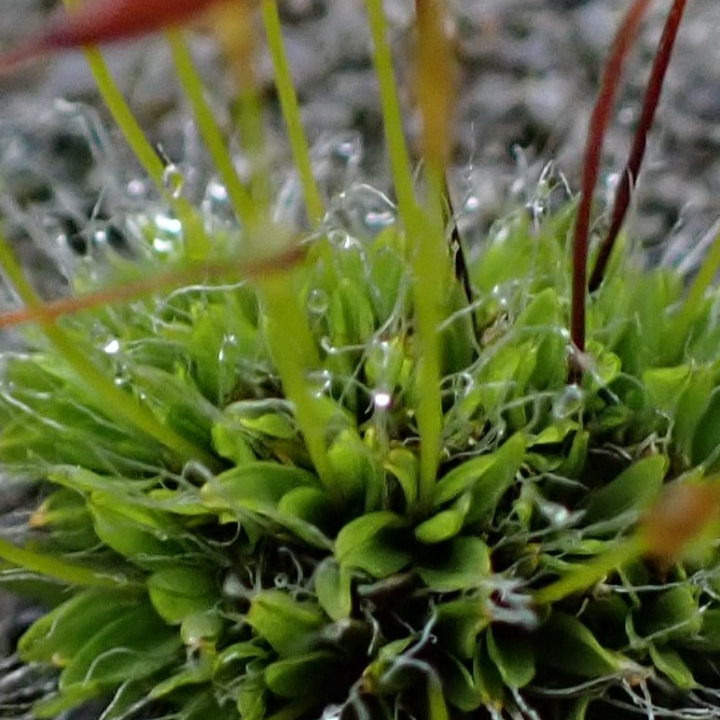

In [ ]:
def resize_to_center(image, target_size=(720, 720)):
    # Obtener las dimensiones de la imagen original
    h, w = image.shape[:2]

    # Calcular el centro de la imagen
    center_x, center_y = w // 2, h // 2

    # Determinar el tamaño del recorte
    target_h, target_w = target_size

    # Calcular los límites del recorte alrededor del centro
    x1 = max(center_x - target_w // 2, 0)
    y1 = max(center_y - target_h // 2, 0)
    x2 = min(center_x + target_w // 2, w)
    y2 = min(center_y + target_h // 2, h)

    # Extraer la región central de la imagen
    cropped_image = image[y1:y2, x1:x2]

    # Si la imagen recortada es más pequeña que el tamaño objetivo, hacemos padding
    if cropped_image.shape[0] < target_h or cropped_image.shape[1] < target_w:
        # Crear una nueva imagen con el tamaño deseado y fondo negro (0)
        padded_image = np.zeros((target_h, target_w, 3), dtype=np.uint8)

        # Calcular las posiciones de inicio de los recortes para el padding
        pad_top = (target_h - cropped_image.shape[0]) // 2
        pad_bottom = target_h - cropped_image.shape[0] - pad_top
        pad_left = (target_w - cropped_image.shape[1]) // 2
        pad_right = target_w - cropped_image.shape[1] - pad_left

        # Colocar la imagen recortada en el centro de la nueva imagen con padding
        padded_image[pad_top:pad_top+cropped_image.shape[0],
                     pad_left:pad_left+cropped_image.shape[1]] = cropped_image

        return padded_image
    else:
        return cropped_image

# Cargar la imagen
image = cv2.imread('/content/imagenes_gbif/imagen_1.jpg')

# Redimensionar la imagen
resized_image_1 = resize_to_center(image)

# Mostrar la imagen redimensionada usando cv2_imshow en Colab
cv2_imshow(resized_image_1)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### 2. Resize the Image Directly Using OpenCV's Function

This method directly resizes the image to the target size, which works well but has some limitations:

- When the image's height or width doesn't match the desired dimensions, OpenCV "stretches" the image to fit the space. This, however, distorts the image, which makes it less viable for feature extraction purposes.

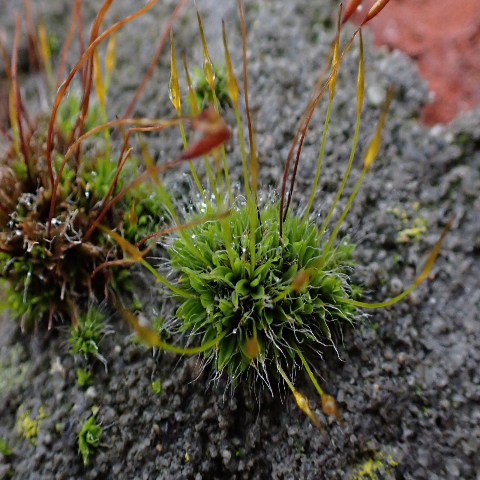

In [ ]:
# Cargar la imagen
image = cv2.imread('/content/imagenes_gbif/imagen_1.jpg')

# Redimensionar la imagen a un tamaño más pequeño (por ejemplo, 720x720)
resized_image_2 = cv2.resize(image, (480, 480))

# Mostrar la imagen redimensionada usando cv2_imshow en Colab
cv2_imshow(resized_image_2)
cv2.waitKey(0)
cv2.destroyAllWindows()


#### 3. Resize the Image Proportionally to the Desired Dimension While Maintaining the Aspect Ratio

This method seems like the best option, as:

- It does not distort the image.

- If there is empty space left, it is filled with zeros (a black background)

However, resolution is lost in all the options, but this method is the best we can achieve.

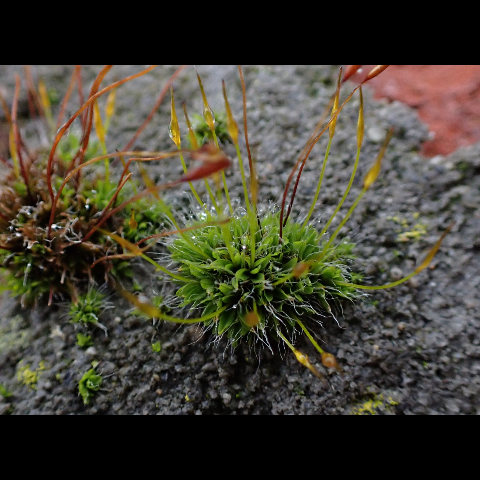

In [ ]:
# Cargar la imagen
image = cv2.imread('/content/imagenes_gbif/imagen_1.jpg')

# Dimensiones objetivo
target_size = (480, 480)

# Obtener las dimensiones originales
h, w = image.shape[:2]

# Calcular la relación de aspecto
aspect_ratio = w / h

# Redimensionar la imagen manteniendo la relación de aspecto
if aspect_ratio > 1:  # Imagen más ancha que alta
    new_w = target_size[0]
    new_h = int(new_w / aspect_ratio)
else:  # Imagen más alta que ancha o cuadrada
    new_h = target_size[1]
    new_w = int(new_h * aspect_ratio)

# Redimensionar la imagen
resized_image = cv2.resize(image, (new_w, new_h))

# Crear una nueva imagen de fondo negro con el tamaño objetivo
black_background = np.zeros((target_size[1], target_size[0], 3), dtype=np.uint8)

# Calcular el margen para centrar la imagen redimensionada en el fondo negro
x_offset = (target_size[0] - new_w) // 2
y_offset = (target_size[1] - new_h) // 2

# Colocar la imagen redimensionada sobre el fondo negro
black_background[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized_image

# Mostrar la imagen resultante
cv2_imshow(black_background)
cv2.waitKey(0)
cv2.destroyAllWindows()


#### Lets perform a comparison between the 3 methods

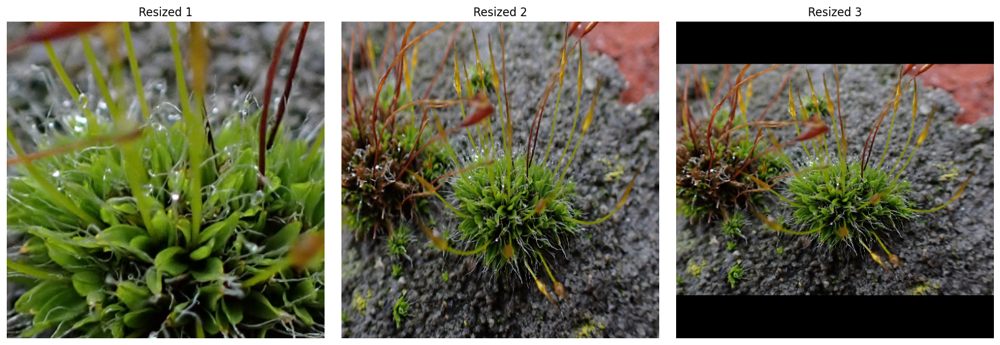

In [ ]:
# Primero convertimos de BGR a RGB
resized_image_1_rgb = cv2.cvtColor(resized_image_1, cv2.COLOR_BGR2RGB)
resized_image_2_rgb = cv2.cvtColor(resized_image_2, cv2.COLOR_BGR2RGB)
black_background_rgb = cv2.cvtColor(black_background, cv2.COLOR_BGR2RGB)

# Crear una figura con 1 fila y 3 columnas
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Mostrar la primera imagen
axes[0].imshow(resized_image_1_rgb)
axes[0].set_title("Resized 1")
axes[0].axis('off')  # Desactivar los ejes

# Mostrar la segunda imagen
axes[1].imshow(resized_image_2_rgb)
axes[1].set_title("Resized 2")
axes[1].axis('off')  # Desactivar los ejes

# Mostrar la tercera imagen
axes[2].imshow(black_background_rgb)
axes[2].set_title("Resized 3")
axes[2].axis('off')  # Desactivar los ejes

# Ajustar el layout para que las imágenes no se sobrepongan
plt.tight_layout()

# Mostrar el gráfico
plt.show()

### Resize all the images we have *(in this case using the third way to resize)*

In [ ]:
def resize_images_in_folder(folder_path, output_folder, target_size=(480, 480)):
    # Verificar si la carpeta de salida existe, si no, crearla
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Listar todos los archivos en la carpeta
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

    # Iterar sobre los archivos de imagen en la carpeta
    for image_file in image_files:
        # Cargar la imagen
        img_path = os.path.join(folder_path, image_file)
        image = cv2.imread(img_path)

        if image is not None:
            # Obtener las dimensiones originales
            h, w = image.shape[:2]

            # Calcular la relación de aspecto
            aspect_ratio = w / h

            # Redimensionar la imagen manteniendo la relación de aspecto
            if aspect_ratio > 1:  # Imagen más ancha que alta
                new_w = target_size[0]
                new_h = int(new_w / aspect_ratio)
            else:  # Imagen más alta que ancha o cuadrada
                new_h = target_size[1]
                new_w = int(new_h * aspect_ratio)

            # Redimensionar la imagen
            resized_image = cv2.resize(image, (new_w, new_h))

            # Crear una nueva imagen de fondo negro con el tamaño objetivo
            black_background = np.zeros((target_size[1], target_size[0], 3), dtype=np.uint8)

            # Calcular el margen para centrar la imagen redimensionada en el fondo negro
            x_offset = (target_size[0] - new_w) // 2
            y_offset = (target_size[1] - new_h) // 2

            # Colocar la imagen redimensionada sobre el fondo negro
            black_background[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized_image

            # Guardar la imagen redimensionada en la carpeta de salida
            output_path = os.path.join(output_folder, image_file)
            cv2.imwrite(output_path, black_background)
            print(f"Imagen guardada: {output_path}")

In [ ]:
# Call the function
input_folder = '/content/imagenes_gbif'  # Cambia a tu ruta de carpeta de entrada
output_folder = '/content/imagenes_redimensionadas'  # Ruta de la carpeta donde quieres guardar las imágenes
resize_images_in_folder(input_folder, output_folder, target_size=(480, 480))


Imagen guardada: /content/imagenes_redimensionadas/imagen_144.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_97.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_5.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_59.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_200.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_180.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_27.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_81.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_84.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_103.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_129.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_43.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_14.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_1.jpg
Imagen guardada: /content/imagenes_redimensionadas/imagen_122.jpg
Imagen guardada: /con

En caso de que querramos guardar la información en un archivo .ZIP podemos ejecutar el siguiente código

In [ ]:
import shutil

In [ ]:
def zip_folder(folder_path, zip_name):
    # Comprimir la carpeta en un archivo .zip
    shutil.make_archive(zip_name, 'zip', folder_path)
    print(f"Carpeta comprimida en: {zip_name}.zip")

Carpeta comprimida en: /content/imagenes_redimensionadas.zip


In [ ]:
folder_path = '/content/imagenes_gbif'
zip_name = '/content/imagenes_gbif'

zip_folder(folder_path, zip_name)

Carpeta comprimida en: /content/imagenes_gbif.zip


In [ ]:
folder_path = '/content/imagenes_redimensionadas'
zip_name = '/content/imagenes_redimensionadas'

zip_folder(folder_path, zip_name)

### Convolutions
To perform the convolution, we need the following components:

- Image Dimensions: These are essential for the algorithm to carry out the desired convolution operations.

- Kernel or Filter: This defines the features we want to extract. For our case, we chose the Laplace kernel to obtain the edges.

- Stride: This defines how we traverse the image to apply the desired kernel. A Stride = 1 was set according to the requirements of the exercise.

- Padding: This defines whether we want to add a matrix of zeros "around" the image to prevent losing the image size during the convolution. However, for the purposes of this exercise, we decided on Padding = 0 *(Which means no padding)*.

In [ ]:
# Laplace Kernel
kernel = np.array([[-1, -1, -1],
                   [-1,  8, -1],
                   [-1, -1, -1]])

#### Function Dimension Output:
This is necessary as it allows us to determine the size of the convolution, which must be defined. Additionally, it is defined in this way to handle square images (those with equal width and height).



In [ ]:
def len_dim_output(dim_input, padding=0, kernel_size=3, stride=1):
    # Si las dimensiones de entrada son iguales (imagen cuadrada)
    if dim_input[0] == dim_input[1]:
        # Calcular la dimensión de la salida
        output_dim = int(np.floor((dim_input[0] + 2 * padding - kernel_size) / stride + 1))
        # Devolver la tupla (output_dim, output_dim) para filas y columnas
        return (output_dim, output_dim)
    else:
        # Calcular las dimensiones para filas y columnas por separado
        output_w_dim = int(np.floor((dim_input[1] + 2 * padding - kernel_size) / stride + 1))
        output_h_dim = int(np.floor((dim_input[0] + 2 * padding - kernel_size) / stride + 1))
        # Devolver la tupla (output_h_dim, output_w_dim)
        return (output_h_dim, output_w_dim)


#### Function to Generate the Zero Matrix:
This function takes an argument in the form of a tuple (n×m) or (n×n), depending on the case. In this instance, it is (n×n). This argument is obtained from the len_dim_output() function.

In [ ]:
def gen_cero_matrix(dim_input):
  return np.zeros(dim_input)

#### Function to apply the convolution

In [ ]:
def apply_convolution(channel, kernel, output_dim):
    """
    Aplica una convolución manualmente a un solo canal de la imagen con un kernel dado.

    Args:
    - channel (numpy.ndarray): El canal de la imagen (rojo, verde, azul).
    - kernel (numpy.ndarray): El kernel o filtro a aplicar (por ejemplo, el de Laplace).
    - output_dim (tuple): Las dimensiones de la salida (alto, ancho).

    Returns:
    - numpy.ndarray: La imagen de salida después de la convolución.
    """

    # Crear una imagen de salida de ceros con las dimensiones de salida proporcionadas
    output = np.zeros(output_dim)

    # Aplicar la convolución utilizando un bucle
    for i in range(output_dim[0]):  # Recorrer filas
        for j in range(output_dim[1]):  # Recorrer columnas
            # Tomar un bloque 3x3 del canal
            fragment = channel[i:i+3, j:j+3]

            # Realizar la convolución multiplicando el fragmento por el kernel y sumando
            result = np.sum(fragment * kernel)

            # Asignar el resultado en la imagen de salida
            output[i, j] = result

    return output

#### Example

In [ ]:
# Cargar la imagen
img = cv2.imread('/content/imagenes_redimensionadas/imagen_1.jpg',cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Verificar si la imagen fue cargada correctamente
if img is not None:
    print(img.shape)  # Imprime las dimensiones de la imagen
else:
    print("Error al cargar la imagen.")

(480, 480, 3)


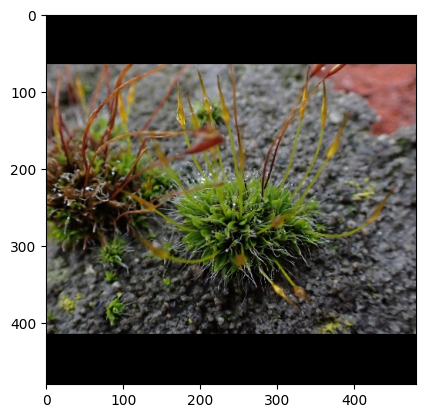

In [ ]:
plt.imshow(img_rgb)

In [ ]:
# Separar los canales RGB
red_channel = img_rgb[:, :, 0]  # Canal Rojo
green_channel = img_rgb[:, :, 1]  # Canal Verde
blue_channel = img_rgb[:, :, 2]  # Canal Azul

In [ ]:
# no importa el canal del cual se extraiga el shape ya que es la misma img
output_red_channel = gen_cero_matrix(len_dim_output(red_channel.shape))
output_green_chanel = gen_cero_matrix(len_dim_output(red_channel.shape))
output_blue_channel = gen_cero_matrix(len_dim_output(red_channel.shape))

In [ ]:
red_channel_filtered = apply_convolution(red_channel, kernel, output_red_channel.shape)
green_channel_filtered = apply_convolution(green_channel, kernel, output_green_chanel.shape)
blue_channel_filtered = apply_convolution(blue_channel, kernel, output_blue_channel.shape)

In [ ]:
red_channel_filtered[:100, :200]

array([[  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       ...,
       [-39., -15.,   3., ...,  21.,  -2., -42.],
       [ 23.,  21.,   2., ...,  18.,  -8., -16.],
       [ 11., -29., -69., ...,  -2., -13.,  -2.]])

In [ ]:
green_channel_filtered[:100, :200]

array([[  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       ...,
       [-37., -25.,   4., ...,  18.,   5., -33.],
       [ 23.,  14.,   9., ...,  13.,  -4., -11.],
       [ 21., -40., -71., ...,  -6., -11.,  16.]])

In [ ]:
blue_channel_filtered[:100, :200]

array([[  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       ...,
       [-53.,  -7.,   4., ...,  16.,   2.,   6.],
       [  8.,  14.,  11., ...,  13., -10.,  25.],
       [ 14., -49., -81., ..., -11., -17.,  37.]])

In [ ]:
# Combinar los tres canales filtrados manualmente para generar una sola img
img_filtered_rgb = np.stack([red_channel_filtered, green_channel_filtered, blue_channel_filtered], axis=2)
img_filtered_rgb[:100, :200, :3]

array([[[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        ...,
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        ...,
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        ...,
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       ...,

       [[-39., -37., -53.],
        [-15., -25.,  -7.],
        [  3.,   4.,   4.],
        ...,
        [ 21.,  18.,  16.],
        [ -2.,   5.,   2.],
        [-42., -33.,   6.]],

       [[ 23.,  23.,   8.],
        [ 21.,  14.,  14.],
        [  2.,   9.,  11.],
        ...,
        [ 18.,  13.,  13.],
        [ -8.,  -4., -10.],
        [-16., -11.,  25.]],

       [[ 11.,  21.,  14.],
        [-29., -40., -49.],
        [-69., -

In [ ]:
# Aplicar Leaky ReLU
def leaky_relu(img, alpha=0.01):
    # Leaky ReLU para cada canal de la imagen
    return np.where(img > 0, img, alpha * img)

# Aplicar Leaky ReLU a la imagen
img_leaky_relu = leaky_relu(img_filtered_rgb, alpha=0.01)


In [ ]:
# Realizar Average Pooling
def average_pooling(img, pool_size=(2, 2)):
    # Realizamos un pooling promedio de tamaño 2x2
    pooled_img = cv2.resize(img, (img.shape[1] // pool_size[1], img.shape[0] // pool_size[0]), interpolation=cv2.INTER_AREA)
    return pooled_img

# Aplicar Average Pooling
img_pooled = average_pooling(img_leaky_relu, pool_size=(2, 2))

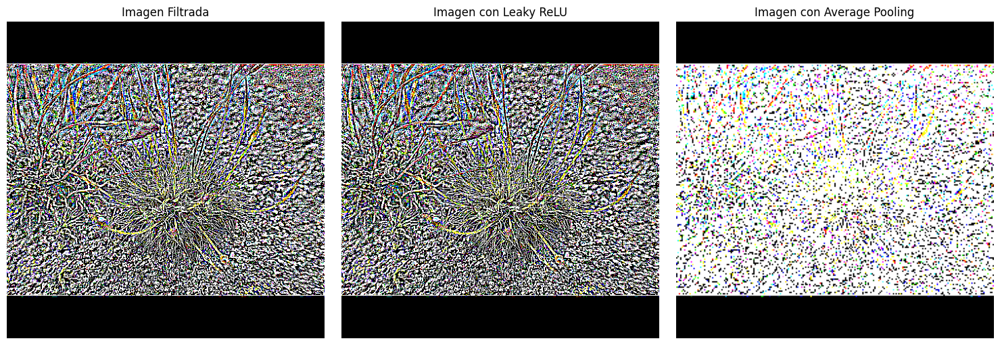

In [ ]:
# 3. Mostrar las imágenes resultantes
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Mostrar la imagen original filtrada
axes[0].imshow(img_filtered_rgb)
axes[0].set_title("Imagen Filtrada")
axes[0].axis('off')

# Mostrar la imagen con Leaky ReLU aplicada
axes[1].imshow(img_leaky_relu)
axes[1].set_title("Imagen con Leaky ReLU")
axes[1].axis('off')

# Mostrar la imagen después de Average Pooling
axes[2].imshow(img_pooled)
axes[2].set_title("Imagen con Average Pooling")
axes[2].axis('off')

plt.tight_layout()
plt.show()

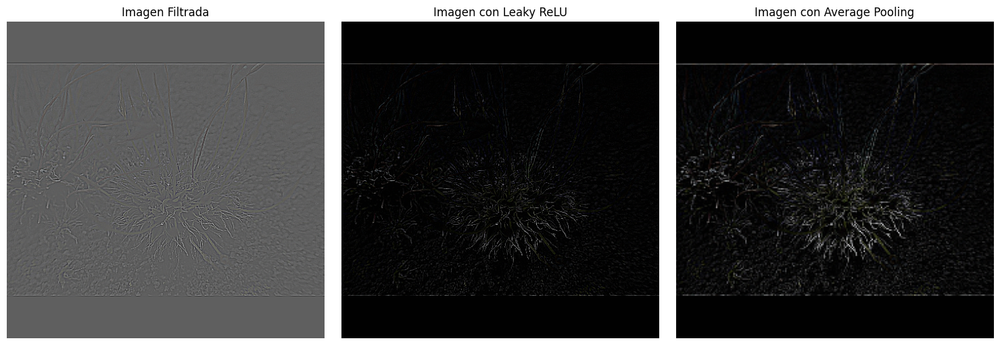

In [ ]:
# 3. Normalización de la imagen filtrada
def normalize_image(img):
    # Normalizar para que los valores estén entre 0 y 255
    min_val = np.min(img)
    max_val = np.max(img)
    normalized_img = (img - min_val) / (max_val - min_val) * 255
    return np.uint8(normalized_img)

# Normalizar las imágenes
img_filtered_normalized = normalize_image(img_filtered_rgb)
img_leaky_relu_normalized = normalize_image(img_leaky_relu)
img_pooled_normalized = normalize_image(img_pooled)

# 4. Mostrar las imágenes resultantes
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Mostrar la imagen original filtrada
axes[0].imshow(img_filtered_normalized)
axes[0].set_title("Imagen Filtrada")
axes[0].axis('off')

# Mostrar la imagen con Leaky ReLU aplicada
axes[1].imshow(img_leaky_relu_normalized)
axes[1].set_title("Imagen con Leaky ReLU")
axes[1].axis('off')

# Mostrar la imagen después de Average Pooling
axes[2].imshow(img_pooled_normalized)
axes[2].set_title("Imagen con Average Pooling")
axes[2].axis('off')

plt.tight_layout()
plt.show()

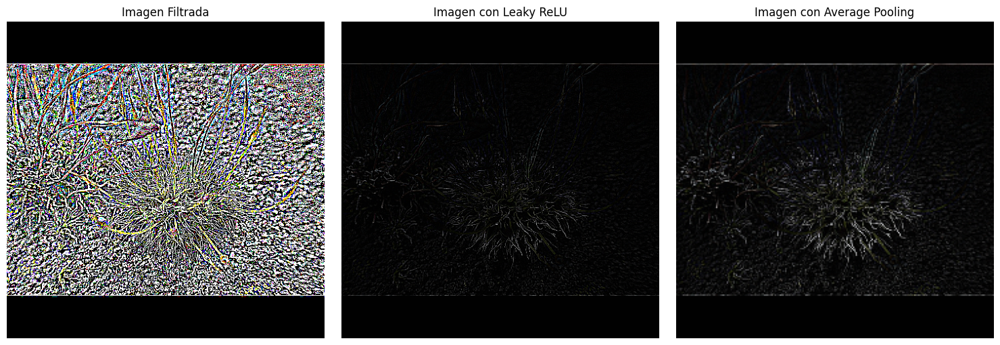

In [ ]:
# 3. Normalización de la imagen para el rango [0, 1]
def normalize_image_0_to_1(img):
    # Normalizar para que los valores estén entre 0 y 1
    min_val = np.min(img)
    max_val = np.max(img)
    normalized_img = (img - min_val) / (max_val - min_val)  # Esto da como resultado un rango de [0, 1]
    return normalized_img

# Normalizar las imágenes
img_leaky_relu_normalized = normalize_image_0_to_1(img_leaky_relu)
img_pooled_normalized = normalize_image_0_to_1(img_pooled)

# 4. Mostrar las imágenes resultantes
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Mostrar la imagen original filtrada
axes[0].imshow(img_filtered_rgb)
axes[0].set_title("Imagen Filtrada")
axes[0].axis('off')

# Mostrar la imagen con Leaky ReLU aplicada
axes[1].imshow(img_leaky_relu_normalized)
axes[1].set_title("Imagen con Leaky ReLU")
axes[1].axis('off')

# Mostrar la imagen después de Average Pooling
axes[2].imshow(img_pooled_normalized)
axes[2].set_title("Imagen con Average Pooling")
axes[2].axis('off')

plt.tight_layout()
plt.show()

#### Apply convolution to all the data

In [ ]:
output_dir = 'imagenes_redimensionadas_filtradas'
create_dir(output_dir)

Folder imagenes_redimensionadas_filtradas created successfully!


In [ ]:
# Bucle para procesar todas las imágenes en la carpeta
for i in os.listdir('/content/imagenes_redimensionadas'):
    # Cargar la imagen
    img = cv2.imread('/content/imagenes_redimensionadas/' + i, cv2.IMREAD_COLOR)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separar los canales RGB
    red_channel = img_rgb[:, :, 0]  # Canal Rojo
    green_channel = img_rgb[:, :, 1]  # Canal Verde
    blue_channel = img_rgb[:, :, 2]  # Canal Azul

    # Crear matrices de salida con ceros (del mismo tamaño que la imagen filtrada)
    output_red_channel = gen_cero_matrix(len_dim_output(red_channel.shape))
    output_green_channel = gen_cero_matrix(len_dim_output(green_channel.shape))
    output_blue_channel = gen_cero_matrix(len_dim_output(blue_channel.shape))

    # Aplicar la convolución a cada canal
    red_channel_filtered = apply_convolution(red_channel, kernel, output_red_channel.shape)
    green_channel_filtered = apply_convolution(green_channel, kernel, output_green_channel.shape)
    blue_channel_filtered = apply_convolution(blue_channel, kernel, output_blue_channel.shape)

    # Recomponer la imagen filtrada (une todos los canales para generar una sola img)
    img_filtered_rgb = np.stack([red_channel_filtered, green_channel_filtered, blue_channel_filtered], axis=2)

    # Asegurar que los valores estén en el rango adecuado (0-255)
    img_filtered_rgb = np.clip(img_filtered_rgb, 0, 255)

    # Convertir la imagen de flotante a tipo uint8 antes de guardarla
    img_filtered_rgb = img_filtered_rgb.astype(np.uint8)

    # Guardar la imagen filtrada en el directorio de salida
    cv2.imwrite(f'{output_dir}/{i}', img_filtered_rgb)

print("Proceso completado")


Proceso completado


In [ ]:
folder_path = '/content/imagenes_redimensionadas_filtradas'
zip_name = '/content/imagenes_redimensionadas_filtradas'

zip_folder(folder_path, zip_name)

Carpeta comprimida en: /content/imagenes_redimensionadas_filtradas.zip


In [ ]:
# Esto solo se usó cuando se quiere corregir lineas de codigo que afectaron al modelo y
# necesitabamos cargar de nuevo toda la info. Esto nos ahorra tiempo y recursos ya que no debemos procesar
# denuevo toda la info


# def extract_zip_files(source_dir):
#     """
#     Extrae todos los archivos .zip en una carpeta y guarda su contenido en una subcarpeta con el mismo nombre.

#     Parameters:
#     - source_dir: Ruta de la carpeta donde se encuentran los archivos .zip.
#     """
#     # Verificar si la carpeta existe
#     if not os.path.exists(source_dir):
#         print(f"La carpeta '{source_dir}' no existe.")
#         return

#     # Recorrer todos los archivos en la carpeta
#     for filename in os.listdir(source_dir):
#         file_path = os.path.join(source_dir, filename)

#         # Verificar si es un archivo .zip
#         if file_path.endswith('.zip'):
#             # Crear una carpeta con el nombre del archivo .zip (sin la extensión)
#             folder_name = os.path.splitext(filename)[0]  # Obtiene el nombre sin la extensión .zip
#             folder_path = os.path.join(source_dir, folder_name)
#             os.makedirs(folder_path, exist_ok=True)  # Crear la carpeta si no existe

#             # Extraer el archivo .zip en la nueva carpeta
#             with zipfile.ZipFile(file_path, 'r') as zip_ref:
#                 zip_ref.extractall(folder_path)

#             print(f"Archivo {filename} extraído en la carpeta '{folder_path}'")

# # Usar la función para extraer los archivos .zip en una carpeta específica
# extract_zip_files('/content')


Archivo imagenes_redimensionadas_filtradas.zip extraído en la carpeta '/content/imagenes_redimensionadas_filtradas'
Archivo imagenes_redimensionadas.zip extraído en la carpeta '/content/imagenes_redimensionadas'


# Test folder

In [ ]:
create_dir('real_test_images')
create_dir('input_test_images')

Folder real_test_images created successfully!
Folder input_test_images created successfully!


In [ ]:
def move_last_images(source_dir, destination_dir, num_images=50):
    """
    Mueve las últimas 'num_images' imágenes de la carpeta de origen a la carpeta de destino.

    Parameters:
    - source_dir: Ruta de la carpeta de origen.
    - destination_dir: Ruta de la carpeta de destino.
    - num_images: Número de imágenes a mover, por defecto 50.
    """
    # Asegurarse de que la carpeta de destino exista
    os.makedirs(destination_dir, exist_ok=True)

    # Listar todos los archivos en la carpeta de origen
    all_files = [f for f in os.listdir(source_dir) if f.endswith(('.jpg', '.png'))]

    # Ordenar los archivos (por nombre o fecha si es necesario)
    all_files.sort()  # Si necesitas ordenar por nombre, si no, usa un criterio diferente

    # Seleccionar las últimas 'num_images' imágenes
    last_files = all_files[-num_images:]

    # Mover las últimas imágenes a la carpeta de destino
    for file in last_files:
        source_path = os.path.join(source_dir, file)
        destination_path = os.path.join(destination_dir, file)
        shutil.move(source_path, destination_path)  # O usa shutil.copy para copiar sin mover

    print(f"Se movieron {len(last_files)} archivos a la carpeta de destino.")


In [ ]:
import shutil

In [ ]:
move_last_images('/content/imagenes_redimensionadas', '/content/real_test_images')

Se movieron 50 archivos a la carpeta de destino.


In [ ]:
move_last_images('/content/imagenes_redimensionadas_filtradas', '/content/input_test_images')

Se movieron 50 archivos a la carpeta de destino.


# Train Folder

In [ ]:
len(os.listdir('/content/imagenes_redimensionadas'))

150

In [ ]:
len(os.listdir('/content/imagenes_redimensionadas_filtradas'))

150

#Pix2Pix

In [ ]:
import tensorflow as tf
from pathlib import Path

En el procedimiento de la creación de la cGan, Nataly hizo un proceso de resize haciendo uso del propio tensorflow, y de un metodo llamado NEAREST_NEIGHBOR. En nuestro caso este proceso de resize ya se realizo así que vamos a dejar la función para hacer una prueba luego y ver si cambia la data

In [ ]:
BUFFER_SIZE = 100
BATCH_SIZE = 1

IMG_WIDTH = 480
IMG_HEIGHT = 480
OUTPUT_CHANNELS = 3

las redes gan trabajan mejior con valores de (-1,1) por lo que debemos pasar todas las imgs a float32

In [ ]:
def load(image_file_input, image_file_real):  # Función para cargar dos imágenes
  # Leer y decodificar el archivo de imagen de entrada
  input_image = tf.io.read_file(image_file_input)
  input_image = tf.io.decode_jpeg(input_image)  # Decodificar el archivo de imagen a tensor

  # Leer y decodificar el archivo de imagen real
  real_image = tf.io.read_file(image_file_real)
  real_image = tf.io.decode_jpeg(real_image)  # Decodificar el archivo de imagen a tensor

  # Convertir ambas imágenes a tensores de tipo float32
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image


# Ramdon Jitter

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  input_image , real_image = resize(input_image, real_image, 536, 536)
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

# Loading the Train & Test Dataset

In [ ]:
def load_images_train(image_file_input, image_file_real):
    input_image, real_image = load(image_file_input, image_file_real)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
    return input_image, real_image

In [ ]:
def load_images_test(image_file_input, image_file_real):
  input_image, real_image = load(image_file_input, image_file_real)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

#### Build an input pipeline with tf.data

In [ ]:
# Listar y ordenar los archivos de imagen
input_train_images_list = sorted([file for file in os.listdir('/content/imagenes_redimensionadas_filtradas') if file.endswith('.jpg')])
real_train_images_list = sorted([file for file in os.listdir('/content/imagenes_redimensionadas') if file.endswith('.jpg')])

# Asegurarse de que ambas listas tengan el mismo número de imágenes
assert len(input_train_images_list) == len(real_train_images_list), "Los datasets no tienen el mismo número de imágenes."

# Verificar que los archivos tengan el mismo nombre
for input_file, real_file in zip(input_train_images_list, real_train_images_list):
    input_name = os.path.splitext(input_file)[0]  # Nombre sin extensión
    real_name = os.path.splitext(real_file)[0]   # Nombre sin extensión

    if input_name != real_name:
        raise ValueError(f"Los nombres de archivo no coinciden: {input_name} vs {real_name}")

# Crear los datasets a partir de las listas de archivos
input_train_images = tf.data.Dataset.from_tensor_slices([os.path.join('/content/imagenes_redimensionadas_filtradas', file) for file in input_train_images_list])
real_train_images = tf.data.Dataset.from_tensor_slices([os.path.join('/content/imagenes_redimensionadas', file) for file in real_train_images_list])

# Combinar los datasets asegurándose de que las imágenes coincidan por nombre
train_dataset = tf.data.Dataset.zip((input_train_images, real_train_images))

# Mapear la función de carga de imágenes a cada par de imágenes
train_dataset = train_dataset.map(lambda input_image, target_image: load_images_test(input_image, target_image), num_parallel_calls=tf.data.AUTOTUNE)

# Configurar el dataset
BATCH_SIZE = 32  # Definir tu tamaño de lote
train_dataset = train_dataset.batch(BATCH_SIZE)

# Verificar que todo está correcto
for input_image, target_image in train_dataset.take(1):
    print(f"Input image batch shape: {input_image.shape}")
    print(f"Target image batch shape: {target_image.shape}")

Input image batch shape: (32, 480, 480, 3)
Target image batch shape: (32, 480, 480, 3)


In [ ]:
# Listar y ordenar los archivos de imagen
input_test_images_list = sorted([file for file in os.listdir('/content/input_test_images') if file.endswith('.jpg')])
real_test_images_list = sorted([file for file in os.listdir('/content/real_test_images') if file.endswith('.jpg')])

# Asegurarse de que ambas listas tengan el mismo número de imágenes
assert len(input_test_images_list) == len(real_test_images_list), "Los datasets no tienen el mismo número de imágenes."

# Verificar que los archivos tengan el mismo nombre
for input_file, real_file in zip(input_test_images_list, real_test_images_list):
    input_name = os.path.splitext(input_file)[0]  # Nombre sin extensión
    real_name = os.path.splitext(real_file)[0]   # Nombre sin extensión

    if input_name != real_name:
        raise ValueError(f"Los nombres de archivo no coinciden: {input_name} vs {real_name}")

# Crear los datasets a partir de las listas de archivos
input_test_images = tf.data.Dataset.from_tensor_slices([os.path.join('/content/input_test_images', file) for file in input_test_images_list])
real_test_images = tf.data.Dataset.from_tensor_slices([os.path.join('/content/real_test_images', file) for file in real_test_images_list])

# Combinar los datasets asegurándose de que las imágenes coincidan por nombre
test_dataset = tf.data.Dataset.zip((input_test_images, real_test_images))

# Mapear la función de carga de imágenes a cada par de imágenes
test_dataset = test_dataset.map(lambda input_image, target_image: load_images_test(input_image, target_image), num_parallel_calls=tf.data.AUTOTUNE)

# Configurar el dataset
BATCH_SIZE = 32  # Definir tu tamaño de lote
test_dataset = test_dataset.batch(BATCH_SIZE)

# Verificar que todo está correcto
for input_image, target_image in test_dataset.take(1):
    print(f"Input image batch shape: {input_image.shape}")
    print(f"Target image batch shape: {target_image.shape}")

Input image batch shape: (32, 480, 480, 3)
Target image batch shape: (32, 480, 480, 3)


# Building the Generator

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)#

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

# Unet

In [ ]:
import tensorflow as tf

def Generator():  # va de matris a matris
    inputs = tf.keras.layers.Input(shape=[480, 480, 3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),
        downsample(480, 4),  # (batch_size, 32, 32, 480)
        downsample(960, 4),  # (batch_size, 16, 16, 960)
        downsample(960, 4),  # (batch_size, 8, 8, 960)
        downsample(960, 4),  # (batch_size, 4, 4, 960)
        downsample(960, 4),  # (batch_size, 2, 2, 960)
        downsample(960, 4),  # (batch_size, 1, 1, 960)
    ]

    up_stack = [
        upsample(960, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(960, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(960, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(960, 4),  # (batch_size, 16, 16, 1024)
        upsample(480, 4),  # (batch_size, 32, 32, 960)
        upsample(256, 4),
        upsample(128, 4),  # (batch_size, 64, 64, 480)
        upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,  # última convolución para imagen de salida
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh')  # (batch_size, 480, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []  # creo una red llamada skip
    for down in down_stack:
        x = down(x)
        skips.append(x)  # arreglo de a,b,c
        print(f"Downsampling: {x.shape}")

    skips = reversed(skips[:-1])  # para que me quede c,b,a

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        print(f"Upsampling: {x.shape}, Skip: {skip.shape}")

        # Resizing la imagen de salida para que coincida con la del skip (si es necesario)
        if x.shape[1] != skip.shape[1] or x.shape[2] != skip.shape[2]:
            x = tf.keras.layers.Resizing(height=skip.shape[1], width=skip.shape[2])(x)

        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)


# Viz the Unet

Downsampling: (None, 240, 240, 64)
Downsampling: (None, 120, 120, 128)
Downsampling: (None, 60, 60, 256)
Downsampling: (None, 30, 30, 480)
Downsampling: (None, 15, 15, 960)
Downsampling: (None, 8, 8, 960)
Downsampling: (None, 4, 4, 960)
Downsampling: (None, 2, 2, 960)
Downsampling: (None, 1, 1, 960)
Upsampling: (None, 2, 2, 960), Skip: (None, 2, 2, 960)
Upsampling: (None, 4, 4, 960), Skip: (None, 4, 4, 960)
Upsampling: (None, 8, 8, 960), Skip: (None, 8, 8, 960)
Upsampling: (None, 16, 16, 960), Skip: (None, 15, 15, 960)
Upsampling: (None, 30, 30, 480), Skip: (None, 30, 30, 480)
Upsampling: (None, 60, 60, 256), Skip: (None, 60, 60, 256)
Upsampling: (None, 120, 120, 128), Skip: (None, 120, 120, 128)
Upsampling: (None, 240, 240, 64), Skip: (None, 240, 240, 64)


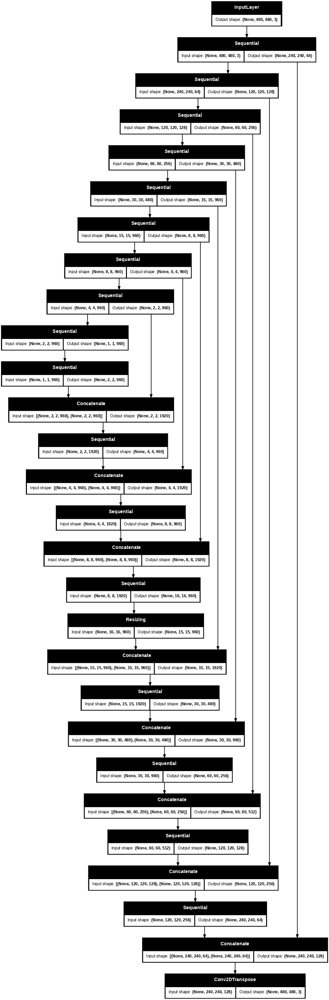

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
LAMBDA = 100#valor del paper (porque si)

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)#binary cross entropy, sotmax para saber la probabilidad del error, aqui no estamos usando ni softmax ni otra, sino que usamos logit=true

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):#perdida adversaria, comparar salida con unos,
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

# Building the Discriminator

In [ ]:
def Discriminator():#me dice si el par de imegenes es falso o no, solo se usa para entrenar
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[480, 480, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[480, 480, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(240, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,# 1 sola capa de convolucion de 30x30
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

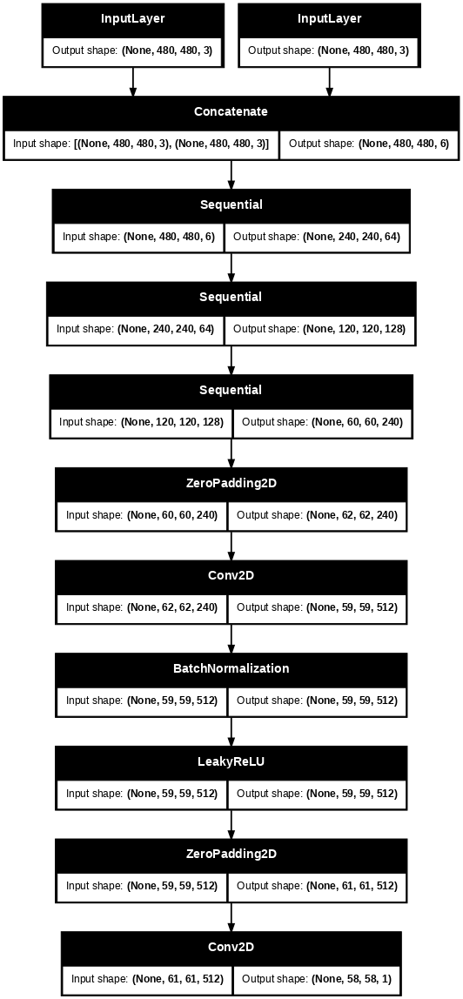

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  """"""
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = 'training_checkpoint'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [ ]:
import time
import datetime
from IPython import display
from IPython.display import clear_output

In [ ]:
log_dir="logs/"#ir guardadno el entrenamiento

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)#esto es lo imotoatnte

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Time taken for 1000 steps: 295.39 sec



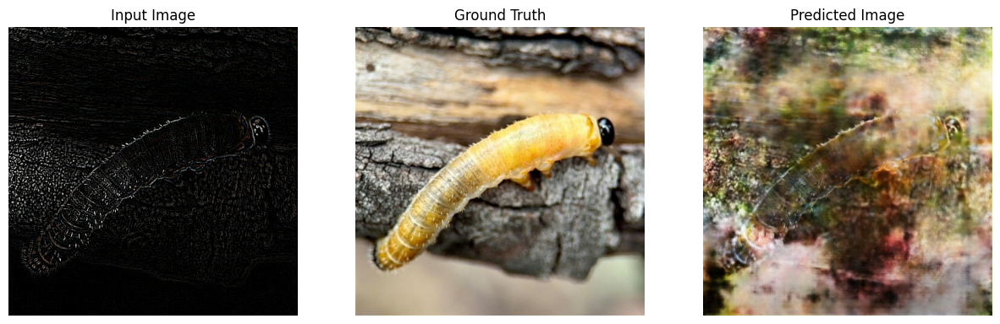

Step: 3k
.

KeyboardInterrupt: 

In [ ]:
fit(train_dataset, test_dataset, steps=4000)

In [ ]:
generator.save('generador.h5')
discriminator.save('discriminator.h5')

# Posibles mejoras

- Más tiempo de computación requerido para mejores resultados ya que el tamaño de nuestras imgs son muy grandes. Por lo cual la cantidad de parámetros se dispara.
- Mayor optimización de los recursos en cuanto a consumo de GPU.
- Implementación de CUDA para tener un max rendimiento.